Arr matey! 🏴‍☠️

Ye be lookin' at the submission notebook, but don't forget the heart and soul o' this adventure be in the trainin' notebook! ⚓

That's where we unleash the power o' the DeBERTa V3 Large model, and it be runnin' like the wind on Kaggle's mighty GPUs, takin' less than 5 hours to complete! 🚀

If ye be wantin' to know how this ship was crafted and set sail, head over to the Training Notebook. There be the treasure map to our journey! 🗺️💰 https://www.kaggle.com/code/verracodeguacas/piirate-training-camp

Now, let's dive into the depths and see what this here submission be all about! 🌊🔍

Before that take a look at these other notebooks for inspiration:
https://www.kaggle.com/code/nbroad/transformer-ner-baseline-lb-0-854 and https://www.kaggle.com/code/takanashihumbert/piidd-deberta-model-starter-inference

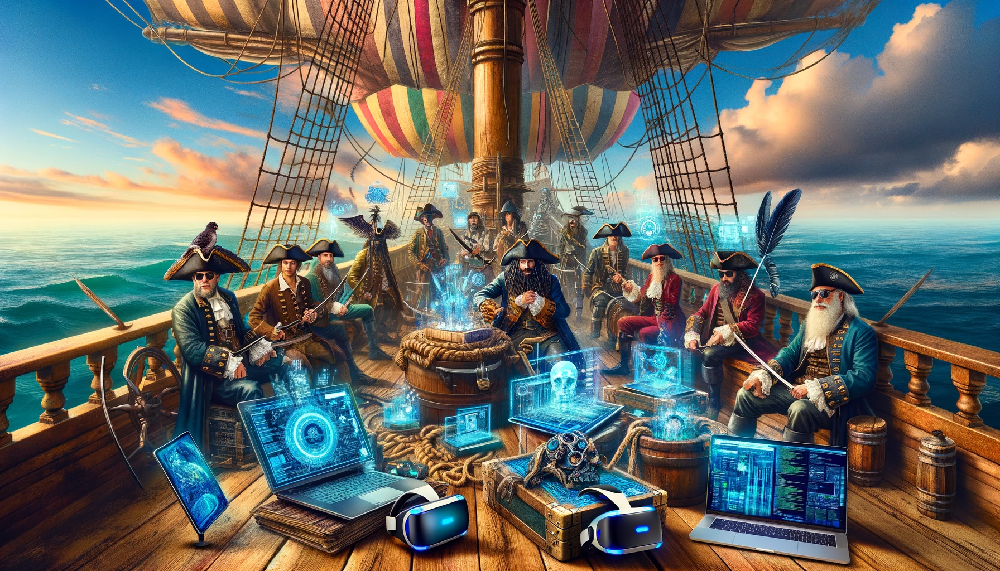

In [1]:
from IPython.display import Image, display

# Display the image
display(Image(filename='/kaggle/input/pii-deberta-models/piirates-on-boat.png'))


In [2]:
import json
import argparse
from itertools import chain
import pandas as pd
from pathlib import Path
from transformers import AutoTokenizer, AutoModelForTokenClassification, Trainer, TrainingArguments, DataCollatorForTokenClassification
from datasets import Dataset
import numpy as np

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Ahoy there, me hearties! Let me spin ye a yarn about this here code, known as 'tokenize':

- **Function Purpose**: This here 'tokenize' function be a vital part of our quest in the world of Natural Language Processing (NLP). Its mission be to take an 'example' and a 'tokenizer,' then turn that text into tokens while keepin' tabs on where they belong.

- **Initialization**: We start by creatin' two lists - 'text' and 'token_map' - to store the tokens and their positions.

- **Tracking Tokens**: The 'idx' variable sets sail at 0 and helps us navigate through the tokens as we process 'em.

- **Token Loop**: We voyage through the tokens and their trailin' white spaces (if any). For each token 't' and its mate, the whitespace 'ws':

    - 't' gets added to the 'text' list so we can gather all the tokens in one place.
    
    - 'token_map' expands by repeatin' 'idx' as many times as there be characters in token 't.' This step be our map to show where each character belongs to which token.
    
    - If there be trailin' whitespace ('ws'), we add a space to 'text' and put a '-1' in 'token_map' to mark where the whitespace lies.

    - 'idx' gets a boost to be ready for the next token on our journey.

- **Tokenization**: The 'text' we've gathered be tokenized using the 'tokenizer' we were given. We also ask for offsets mappings and set a maximum token length ('max_length') to make sure our tokens don't get too unruly.

- **Returning the Result**: The function hands back a chest of treasures in the form of a dictionary. Inside, ye'll find the tokenized data, includin' offset mappings, and the 'token_map.' This be essential for future NLP adventures where knowin' where the tokens sit be key.

This 'tokenize' function be our loyal mate on the high seas of NLP, helpin' us find the buried treasure of information within the text. Aye, it be a treasure map for the crew! 🏴‍☠️💰


In [3]:
INFERENCE_MAX_LENGTH = 2500
# This be a function called 'tokenize', me hearties!
def tokenize(example, tokenizer):
    # We be creatin' two empty lists, 'text' and 'token_map', to store our tokens and their respective maps.
    text = []
    token_map = []
    
    # We start the 'idx' at 0, it be used to keep track of the tokens.
    idx = 0
    
    # Now, we be loopin' through the tokens and their trailin' white spaces.
    for t, ws in zip(example["tokens"], example["trailing_whitespace"]):
        
        # We add the token 't' to the 'text' list.
        text.append(t)
        
        # We be extendin' the 'token_map' list by repeatin' the 'idx' as many times as the length of token 't'.
        token_map.extend([idx]*len(t))
        
        # If there be trailin' whitespace (ws), we add a space to 'text' and mark it with a '-1' in 'token_map'.
        if ws:
            text.append(" ")
            token_map.append(-1)
            
        # We increment 'idx' to keep track of the next token.
        idx += 1
        
    # Now, we tokenize the concatenated 'text' and return offsets mappings along with 'token_map'.
    tokenized = tokenizer("".join(text), return_offsets_mapping=True, truncation=True, max_length=INFERENCE_MAX_LENGTH)
    
    # We return a dictionary containin' the tokenized data and the 'token_map'.
    return {
        **tokenized,
        "token_map": token_map,
    }


Ahoy there, matey! Allow me to decipher this code for ye:

- **Loading Test Data**: We begin by loading test data from a JSON file, setting sail on our data adventure.

- **Creating a Dataset**: Next, we construct a dataset using the data we've loaded. This dataset be our treasure chest, containing details like 'full_text,' 'document,' 'tokens,' and 'trailing_whitespace.'

- **Tokenizer and Model**: We call upon the services of a trusty 'tokenizer' and a fearsome 'model' to aid us in our task. These tools be crucial for handling text data.

- **Parallel Tokenization**: We employ parallel processing to tokenize our dataset using the 'tokenize' function, ensuring speedy execution.

- **Data Collator for Classification**: A 'data collator' be created to assist in token classification, ensuring everything lines up nicely.

- **Training Arguments**: We set the stage with training arguments, specifyin' the output directory, evaluation batch size, and a vow of silence – we won't be reportin' results to any server.

- **Trainer for Evaluation**: Finally, we muster the 'trainer' – a commander for our model, equipped with the model itself, training arguments, data collator, and tokenizer.

With this code, we be ready to evaluate our model's performance on the test data, settin' sail for an exciting NLP adventure! 🏴‍☠️🌊


In [4]:
data_train = json.load(open("/kaggle/input/pii-detection-removal-from-educational-data/train.json"))
train_ds = Dataset.from_dict({
    "full_text": [x["full_text"] for x in data_train],
    "document": [x["document"] for x in data_train],
    "tokens": [x["tokens"] for x in data_train],
    "trailing_whitespace": [x["trailing_whitespace"] for x in data_train],
})

#0:   0%|          | 0/5 [00:00<?, ?ex/s]

#1:   0%|          | 0/5 [00:00<?, ?ex/s]

#0:   0%|          | 0/3404 [00:00<?, ?ex/s]

#1:   0%|          | 0/3403 [00:00<?, ?ex/s]

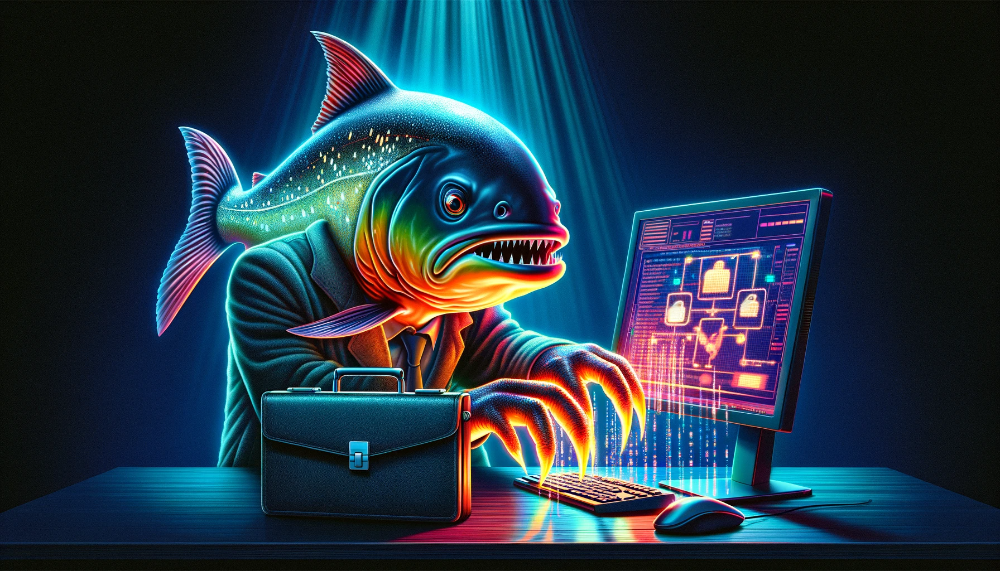

You're using a DebertaV2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


You're using a DebertaV2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


You're using a DebertaV2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


In [5]:
# Load the test data from a JSON file
data = json.load(open("/kaggle/input/pii-detection-removal-from-educational-data/test.json"))

# Create a dataset from the loaded data
ds = Dataset.from_dict({
    "full_text": [x["full_text"] for x in data],
    "document": [x["document"] for x in data],
    "tokens": [x["tokens"] for x in data],
    "trailing_whitespace": [x["trailing_whitespace"] for x in data],
})

# Initialize a tokenizer and model from the pretrained model path
model_paths = {'/kaggle/input/pii-deberta-models/cola-de-piiranha' : 1/3,
              '/kaggle/input/pii-deberta-models/cuerpo-de-piiranha' : 1/3,
              '/kaggle/input/pii-deberta-models/cabeza-de-piiranha' : 1/3}

first_model_path = list(model_paths.keys())[0]

tokenizer = AutoTokenizer.from_pretrained(first_model_path)

# Tokenize the dataset using the 'tokenize' function in parallel
ds = ds.map(tokenize, fn_kwargs={"tokenizer": tokenizer}, num_proc = 2)
train_ds = train_ds.map(tokenize, fn_kwargs={"tokenizer": tokenizer}, num_proc=2)

# Mostrar la piraña asesina
display(Image(filename='/kaggle/input/pii-deberta-models/piiratefisk.png'))

import gc
import torch
import numpy as np

from scipy.special import softmax


all_preds = []

# Calculate the total weight
total_weight = sum(model_paths.values())

for model_path, weight in model_paths.items():
    tokenizer = AutoTokenizer.from_pretrained(model_path)

    model = AutoModelForTokenClassification.from_pretrained(model_path)
    collator = DataCollatorForTokenClassification(tokenizer, pad_to_multiple_of = 16)
    args = TrainingArguments(
        ".", 
        per_device_eval_batch_size=1, 
        report_to="none",
    )
    trainer = Trainer(
        model=model, 
        args=args, 
        data_collator=collator, 
        tokenizer=tokenizer,
        train_dataset = train_ds
    )
    predictions = trainer.predict(ds).predictions
    # This idea from this notebook: https://www.kaggle.com/code/olyatsimboy/912-blending-0-903-0-854-deberta3base
    weighted_predictions = softmax(predictions, axis = -1) * weight
    all_preds.append(weighted_predictions)
    del model, trainer
    torch.cuda.empty_cache()
    gc.collect()

# Calculate the weighted average of predictions
weighted_average_predictions = np.sum(all_preds, axis=0) / total_weight

In [6]:
config = json.load(open(Path(model_path) / "config.json"))
id2label = config["id2label"]
preds = weighted_average_predictions.argmax(-1)
preds_without_O = weighted_average_predictions[:,:,:12].argmax(-1)
O_preds = weighted_average_predictions[:,:,12]
# Change this threshold to "manually" adjust for the FBeta metric
threshold = 0.9875
preds_final = np.where(O_preds < threshold, preds_without_O , preds)

In [7]:
# glance over a sample text
print(ds["full_text"][-3])

Storytelling  The Path to Innovation

Dr Sakir Ahmad

Challenge & Selection

Be it any organization, team or a government venture, I have often observed that they experience  failures because they couldn’t connect with their audience aptly. In such scenarios, storytelling  can turn the table significantly. I have used the tool ‘storytelling’ in my organization to convey a  complicated message as simply as possible or to generate ideas from people around me. The idea  is to implement this innovative tool to make the intricate issues understandable and engage the  targeted audience. I relayed the context of the story to captivate the attention of the audience. I  have used the technique in front of my team-members of the organization to impart its essence,  brainstorm notions, make productive connections and develop appropriate strategies. The crucial  element in storytelling is to engagingly answer the questions raised in the story to its targeted  audience and allow them to resonate wi

🏴‍☠️ Ahoy, me shipmates! Let's unravel the secrets of this code:

- **Triplet Gathering**: Our quest begins with the formation of empty lists to store triplets – valuable loot from the dataset. These triplets consist of a 'label,' 'token_id,' and 'token_str.'

- **Data Exploration Voyage**: We embark on a voyage through the dataset, exploring each prediction ('p'), token mapping ('token_map'), offsets ('offsets'), tokens ('tokens'), and documents ('doc').

- **Treasure in Tokens**: For each prediction, we inspect the tokens and their corresponding offsets. We decipher the 'label_pred' – the predicted label from the token.

- **Navigating the Indices**: We navigate the tricky indices, checking for special cases where the start and end indices sum to zero, or where token mapping is -1.

- **Ignore the Whitespace**: We're savvy enough to ignore leading whitespace tokens ("\n\n") as we seek the real treasure.

- **Forming Triplets**: With the pieces in place, we form a triplet consisting of the 'label_pred,' 'token_id,' and 'token_str.' But, we only add it to our treasure chest ('triplets') if it hasn't been plundered before.

- **Successful Voyage**: Our data exploration voyage yields a bounty of valuable triplets, ready to be analyzed and deciphered!

May these code treasures guide ye to the heart of the dataset! 🏴‍☠️💰


In [8]:
# Prepare to plunder the data for valuable triplets!
triplets = []
document, token, label, token_str = [], [], [], []

# For each prediction, token mapping, offsets, tokens, and document in the dataset
for p, token_map, offsets, tokens, doc in zip(preds_final, ds["token_map"], ds["offset_mapping"], ds["tokens"], ds["document"]):

    # Iterate through each token prediction and its corresponding offsets
    for token_pred, (start_idx, end_idx) in zip(p, offsets):
        label_pred = id2label[str(token_pred)]  # Predicted label from token

        # If start and end indices sum to zero, continue to the next iteration
        if start_idx + end_idx == 0:
            continue

        # If the token mapping at the start index is -1, increment start index
        if token_map[start_idx] == -1:
            start_idx += 1

        # Ignore leading whitespace tokens ("\n\n")
        while start_idx < len(token_map) and tokens[token_map[start_idx]].isspace():
            start_idx += 1

        # If start index exceeds the length of token mapping, break the loop
        if start_idx >= len(token_map):
            break

        token_id = token_map[start_idx]  # Token ID at start index

        # Ignore "O" predictions and whitespace tokens
        if label_pred != "O" and token_id != -1:
            triplet = (label_pred, token_id, tokens[token_id])  # Form a triplet

            # If the triplet is not in the list of triplets, add it
            if triplet not in triplets:
                document.append(doc)
                token.append(token_id)
                label.append(label_pred)
                token_str.append(tokens[token_id])
                triplets.append(triplet)

# We've gathered the valuable triplets from the dataset, ready for analysis!


In [9]:
# Haul in the data and prepare for your quest!
df = pd.DataFrame({
    "document": document,
    "token": token,
    "label": label,
    "token_str": token_str
})

# Assign each row a unique 'row_id'
df["row_id"] = list(range(len(df)))

# Display a glimpse of the first 100 rows of your data
display(df.head(100))

# Cast your findings into a CSV file for further exploration
df[["row_id", "document", "token", "label"]].to_csv("submission.csv", index=False)

# May the winds of fortune guide ye to untold discoveries!


,document,token,label,token_str,row_id
0,7,9,B-NAME_STUDENT,Nathalie,0
1,7,10,I-NAME_STUDENT,Sylla,1
2,7,482,B-NAME_STUDENT,Nathalie,2
3,7,483,I-NAME_STUDENT,Sylla,3
4,7,738,B-NAME_STUDENT,Avril,4
5,7,741,B-NAME_STUDENT,Nathalie,5
6,7,742,I-NAME_STUDENT,Sylla,6
7,10,0,B-NAME_STUDENT,Diego,7
8,10,1,I-NAME_STUDENT,Estrada,8
9,10,464,B-NAME_STUDENT,Diego,9
